# Preparing

## Imports and Functions

In [2]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import regex as re
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models, Sequential, layers, optimizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense, Dropout, LayerNormalization
from tensorflow.keras.callbacks import EarlyStopping

### Normal

In [3]:
folder_path = '/Users/Felix/Google Drive/Felix/code/AgeRecognition/raw_data/Faces'
#folder_path = '/content/UTKFaces/UTKFaces/Faces'

In [4]:
def load_images_from_folder(folder_path,percent=100):
    filenames = [f for f in os.listdir(folder_path) if not f.startswith('.')]
    filenames.sort(key=lambda f: int(re.sub('\D', '', f)))
    images = []
    for filename in filenames:
        img = cv2.imread(os.path.join(folder_path,filename),cv2.IMREAD_UNCHANGED)
        
        scale_percent = percent # percent of original size
        width = int(img.shape[1] * scale_percent / 100)
        height = int(img.shape[0] * scale_percent / 100)
        dim = (width, height)
        
        # resize image
        resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
        cv2.imshow("Resized image", resized)
        #cv2.waitKey(0)
        #cv2.destroyAllWindows()
        if img is not None:
            img_colors = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)
            images.append(img_colors)
    return images

def show_all_images_from_list(img_list,img_df):
    n=int(len(img_list)/5) +1 
    f = plt.figure(figsize=(25,n*5))
    for i,img in enumerate(img_list):
        f.add_subplot(n, 5, i + 1)
        plt.title(f'{img_df.iloc[i]}',
                  fontweight="bold",
                  fontsize=15)
        plt.imshow(img)
        f.tight_layout()

def load_image_data_into_dataframe(folderpath):

    filenames = [f for f in os.listdir(folder_path) if not f.startswith('.')]
    filenames.sort(key=lambda f: int(re.sub('\D', '', f)))
    df = pd.DataFrame()
    for filename in filenames:
        if filename.startswith('81'):
            break
        parsed_name = filename.split('_')
        df= df.append({'age' : int(parsed_name[0]),
                       'gender' : parsed_name[1],
                       'race' : parsed_name[2]}, ignore_index=True)
    df['gender'] = df['gender'].map({'0': 'male', '1': 'female'})
    df['race'] = df['race'].map({'0': 'White', '1': 'Black', '2': 'Asian', '3': 'Indian', '4': 'Others'})
    return df

In [5]:
img_pic=load_images_from_folder(folder_path)

In [6]:
img_df = load_image_data_into_dataframe(folder_path)

## Targets into Age Bins of 5 (Baseline: 6%)

In [7]:
bins= [5*i for i in range(17)]
bins

[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80]

In [8]:
labels = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
img_df['age_group'] = pd.cut(img_df['age'], bins=bins, labels=labels)

In [9]:
img_df.tail(305)

,age,gender,race,age_group
21700,75.0,female,Black,14
21701,75.0,female,Asian,14
21702,75.0,female,Asian,14
21703,75.0,female,Indian,14
21704,76.0,male,White,15
...,...,...,...,...
22000,80.0,female,Black,15
22001,80.0,female,Asian,15
22002,80.0,female,Asian,15
22003,80.0,female,Indian,15


In [10]:
img_df['age_group'].value_counts().sort_values()

15     301
14     359
13     463
2      583
12     674
1      816
11     944
3      971
9      971
8     1062
10    1176
7     1825
0     2308
6     2341
4     2545
5     4666
Name: age_group, dtype: int64

## CNN Preperations Image Size: 100*100

In [11]:
img_pic=load_images_from_folder(folder_path,50)

In [12]:
X = img_pic
y = img_df['age_group']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

X_train = np.array(X_train)
X_test =np.array(X_test)
y_train = np.array(y_train)
y_test =np.array(y_test)
X_train.shape

(19804, 100, 100, 3)

In [13]:
X_train = X_train/255 - 0.5
X_test = X_test/255 - 0.5
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

In [14]:
print(X_train.shape)
print(X_test.shape)

(19804, 100, 100, 3)
(2201, 100, 100, 3)


# CNN A (3 hidden with 50,100,50 )    37,8%

In [123]:
def initialize_model():
    model = models.Sequential()
    ### First convolution & max-pooling
    model.add(layers.Conv2D(8, (4,4), input_shape=(100, 100, 3),
                            activation='relu'))
    model.add(layers.MaxPool2D(pool_size=(2,2)))

    ### Flattening
    model.add(layers.Flatten())

    ### One fully connected
    model.add(layers.Dense(50, activation='relu'))

    ### Second fully connected
    model.add(layers.Dense(100, activation='relu'))

    ### Third fully connected
    model.add(layers.Dense(50, activation='relu'))

    ### Last layer (let's say a classification with 10 output)
    model.add(layers.Dense(16, activation='softmax'))
    return model

model_A = initialize_model()

### Model compilation
model_A.compile(loss='categorical_crossentropy',
          optimizer='adam',
          metrics=['accuracy'])

es = EarlyStopping(patience=5,restore_best_weights=True)

# YOUR CODE HERE
model_A.fit(X_train, y_train_cat, 
          validation_split=0.3,
          callbacks=[es],
          epochs=10, 
          batch_size=32, 
          verbose=1)

print(model_A.evaluate(X_test, y_test_cat, verbose=0)[1])

Epoch 1/10
434/434 [==============================] - 42s 95ms/step - loss: 2.1137 - accuracy: 0.3007 - val_loss: 1.9083 - val_accuracy: 0.3236
Epoch 2/10
434/434 [==============================] - 28s 65ms/step - loss: 1.7917 - accuracy: 0.3569 - val_loss: 1.7672 - val_accuracy: 0.3527
Epoch 3/10
434/434 [==============================] - 32s 74ms/step - loss: 1.6709 - accuracy: 0.3826 - val_loss: 1.7530 - val_accuracy: 0.3576
Epoch 4/10
434/434 [==============================] - 31s 72ms/step - loss: 1.5969 - accuracy: 0.4001 - val_loss: 1.8087 - val_accuracy: 0.3401
Epoch 5/10
434/434 [==============================] - 29s 66ms/step - loss: 1.5290 - accuracy: 0.4142 - val_loss: 1.7477 - val_accuracy: 0.3672
Epoch 6/10
434/434 [==============================] - 36s 82ms/step - loss: 1.4770 - accuracy: 0.4346 - val_loss: 1.8233 - val_accuracy: 0.3596
Epoch 7/10
434/434 [==============================] - 34s 78ms/step - loss: 1.4072 - accuracy: 0.4583 - val_loss: 1.8314 - val_accuracy:

# CNN B (1 hidden with 50) 33,9 %

In [128]:
def initialize_model():
    model = models.Sequential()
    ### First convolution & max-pooling
    model.add(layers.Conv2D(8, (4,4), input_shape=(100, 100, 3),
                            activation='relu'))
    model.add(layers.MaxPool2D(pool_size=(2,2)))

    ### Flattening
    model.add(layers.Flatten())

    ### One fully connected
    model.add(layers.Dense(50, activation='relu'))

    ### Last layer (let's say a classification with 10 output)
    model.add(layers.Dense(16, activation='softmax'))
    return model

model_B = initialize_model()

### Model compilation
model_B.compile(loss='categorical_crossentropy',
          optimizer='adam',
          metrics=['accuracy'])

es = EarlyStopping(patience=5,restore_best_weights=True)

# YOUR CODE HERE
model_B.fit(X_train, y_train_cat, 
          validation_split=0.3,
          callbacks=[es],
          epochs=10, 
          batch_size=32, 
          verbose=1)

print(model_B.evaluate(X_test, y_test_cat, verbose=0)[1])

Epoch 1/10
434/434 [==============================] - 32s 71ms/step - loss: 2.0882 - accuracy: 0.3085 - val_loss: 1.8983 - val_accuracy: 0.3379
Epoch 2/10
434/434 [==============================] - 26s 60ms/step - loss: 1.7469 - accuracy: 0.3792 - val_loss: 1.8029 - val_accuracy: 0.3534
Epoch 3/10
434/434 [==============================] - 45s 104ms/step - loss: 1.5869 - accuracy: 0.4271 - val_loss: 1.7969 - val_accuracy: 0.3475
Epoch 4/10
434/434 [==============================] - 45s 103ms/step - loss: 1.4715 - accuracy: 0.4683 - val_loss: 1.7893 - val_accuracy: 0.3511
Epoch 5/10
434/434 [==============================] - 40s 92ms/step - loss: 1.3438 - accuracy: 0.5137 - val_loss: 1.8545 - val_accuracy: 0.3507
Epoch 6/10
434/434 [==============================] - 67s 155ms/step - loss: 1.2311 - accuracy: 0.5525 - val_loss: 1.9500 - val_accuracy: 0.3305
Epoch 7/10
434/434 [==============================] - 61s 140ms/step - loss: 1.1181 - accuracy: 0.5942 - val_loss: 2.0154 - val_accur

# CNN C (Copy from Cifar Classification)    37,8 %

In [132]:
def initialize_model():
    model = models.Sequential()
    model.add(Conv2D(16, (3, 3), activation='relu', padding='same', input_shape=(100, 100, 3)))
    #model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
    #model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(64, (2, 2), activation='relu', padding='same'))
    #model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Dropout(0.3))
    model.add(MaxPooling2D((2, 2)))

    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(16, activation='softmax'))
    return model

model_C = initialize_model()

opt = optimizers.Adam(learning_rate=0.001)
model_C.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

es = EarlyStopping(patience=10,restore_best_weights=True)

model_C.fit(X_train, y_train_cat, 
          validation_split=0.3,
          callbacks=[es],
          epochs=100, 
          batch_size=32, 
          verbose=1)

print(model_C.evaluate(X_test, y_test_cat, verbose=0)[1])

Epoch 1/100
434/434 [==============================] - 105s 237ms/step - loss: 2.2897 - accuracy: 0.2736 - val_loss: 2.1534 - val_accuracy: 0.3097
Epoch 2/100
434/434 [==============================] - 176s 407ms/step - loss: 2.0081 - accuracy: 0.3191 - val_loss: 1.9339 - val_accuracy: 0.3287
Epoch 3/100
434/434 [==============================] - 106s 243ms/step - loss: 1.9100 - accuracy: 0.3351 - val_loss: 1.8716 - val_accuracy: 0.3374
Epoch 4/100
434/434 [==============================] - 111s 255ms/step - loss: 1.8316 - accuracy: 0.3466 - val_loss: 1.7993 - val_accuracy: 0.3554
Epoch 5/100
434/434 [==============================] - 94s 216ms/step - loss: 1.7843 - accuracy: 0.3561 - val_loss: 1.7612 - val_accuracy: 0.3595
Epoch 6/100
434/434 [==============================] - 83s 191ms/step - loss: 1.7472 - accuracy: 0.3657 - val_loss: 1.7258 - val_accuracy: 0.3603
Epoch 7/100
434/434 [==============================] - 79s 181ms/step - loss: 1.7115 - accuracy: 0.3678 - val_loss: 1.71

# Evaluation of the Model

In [133]:
def convert_number(num):
    if num == 0:
        return '1-5'
    elif num == 1:
        return '6-10'
    elif num == 2:
        return '11-15'
    elif num == 3:
        return '16-20'
    elif num == 4:
        return '21-25'
    elif num == 5:
        return '26-30'
    elif num == 6:
        return '31-35'
    elif num == 7:
        return '36-40'
    elif num == 8:
        return '41-45'
    elif num == 9:
        return '46-50'
    elif num == 10:
        return '51-55'
    elif num == 11:
        return '56-60'
    elif num == 12:
        return '61-65'
    elif num == 13:
        return '66-70'
    elif num == 14:
        return '71-75'
    else:
        return '76-80'

In [139]:
convert_number(9)

'46-50'

In [141]:
def show_images_from_list_with_prediction(img_list,real,pred_list):
    n=int(len(img_list)/5) +1 
    f = plt.figure(figsize=(25,n*5))
    for i,img in enumerate(img_list):
        f.add_subplot(n, 5, i + 1)
        plt.title(f'Real: {convert_number(int(real[i]))} \n Prediction: {convert_number(int(np.argsort(pred_list[i])[-1]))}',
                  fontweight="bold",
                  fontsize=15)
        plt.imshow(img)
        f.tight_layout()

In [135]:
X_test_show = (X_test + 0.5)

## Model A

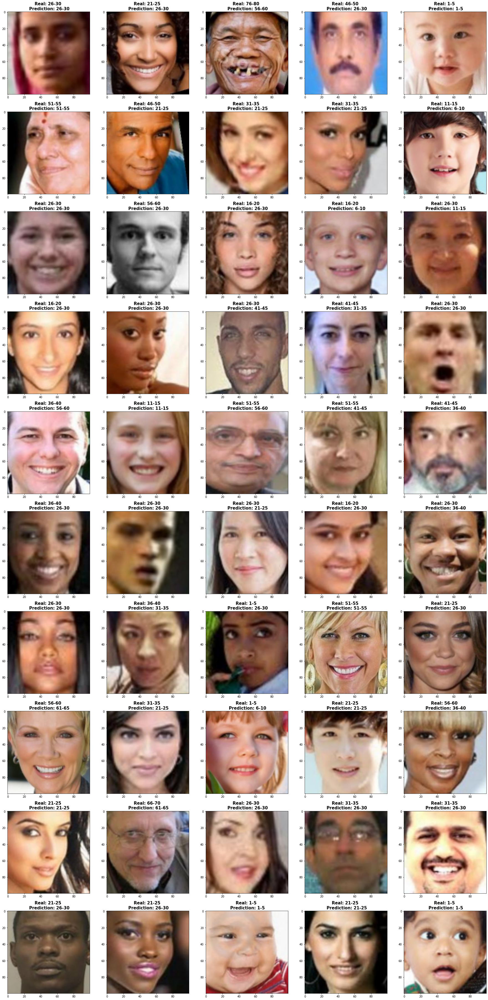

In [145]:
pred_list_A = model_A.predict(X_test)
show_images_from_list_with_prediction(X_test_show[:50],y_test[:50],pred_list_A[:50])

## Model B

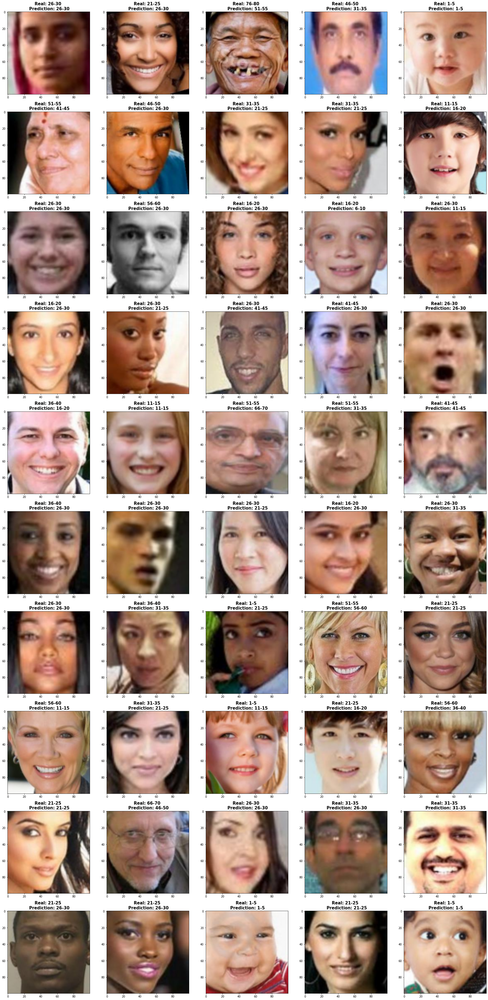

In [143]:
pred_list_B = model_B.predict(X_test)
show_images_from_list_with_prediction(X_test_show[:50],y_test[:50],pred_list_B[:50])

## Model C

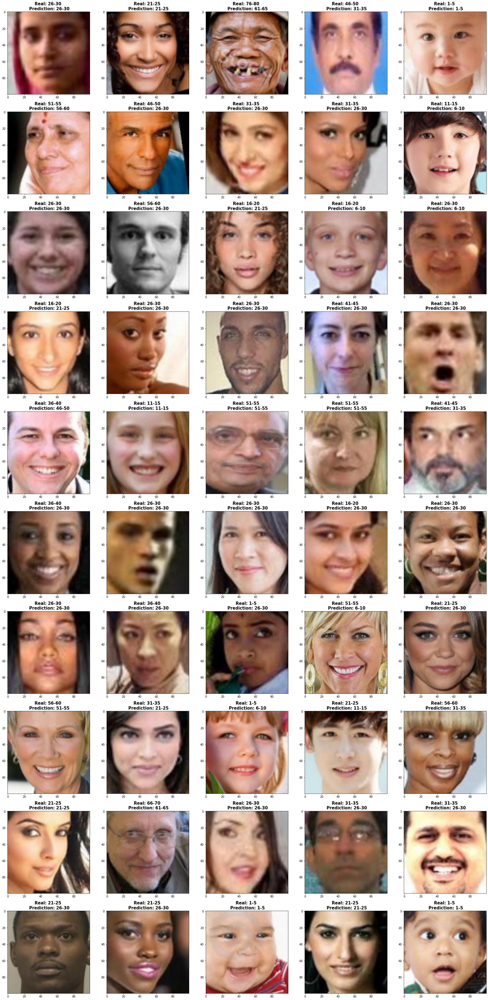

In [144]:
pred_list_C = model_C.predict(X_test)
show_images_from_list_with_prediction(X_test_show[:50],y_test[:50],pred_list_C[:50])

# Others

In [115]:
pred_df = pd.DataFrame()
for element in pred_list[:10]:
    sort_list = np.argsort(element)
    pred_df= pred_df.append({
        'Prediction:': int(sort_list[-1]),
         : element[0],
        sort_list[-2] : element[sort_list[-2]],
        sort_list[-3] : element[sort_list[-3]],
        sort_list[-4] : element[sort_list[-4]],
        sort_list[-5] : element[sort_list[-5]]
    },ignore_index=True)